In [29]:
import os
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.visualization import (ZScaleInterval, ImageNormalize)
import tensorflow as tf
from tensorflow import keras
import tensorflow.keras.backend as K

%load_ext autoreload
from functions import *
from create_models import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
!pip freeze

absl-py==0.11.0
aenum==3.0.0
anaconda==0.0.1.1
anyio==2.2.0
argon2-cffi==20.1.0
astropy==4.1
astroquery==0.4.1
astunparse==1.6.3
async-generator==1.10
attrs==20.3.0
Babel==2.9.1
backcall==0.2.0
beautifulsoup4==4.9.3
bleach==3.2.1
cachetools==4.2.0
cadcutils==1.1.30
certifi==2020.12.5
cffi==1.14.4
chardet==4.0.0
cryptography==3.4.4
cycler==0.10.0
decorator==4.4.2
defusedxml==0.6.0
deprecation==2.1.0
distro==1.5.0
entrypoints==0.3
esutil==0.6.5
fitsio==1.1.2
flatbuffers==1.12
future==0.18.2
gast==0.3.3
google-auth==1.24.0
google-auth-oauthlib==0.4.2
google-pasta==0.2.0
grpcio==1.32.0
h5py==2.10.0
html2text==2020.1.16
html5lib==1.1
idna==2.10
imageio==2.9.0
ipykernel==5.4.2
ipython==7.19.0
ipython-genutils==0.2.0
ipywidgets==7.6.2
jedi==0.18.0
jeepney==0.6.0
Jinja2==2.11.2
joblib==1.0.0
json5==0.9.5
jsonschema==3.2.0
jupyter==1.0.0
jupyter-client==6.1.7
jupyter-console==6.2.0
jupyter-core==4.7.0
jupyter-packaging==0.9.2
jupyter-server==1.6.4
jupyterlab==3.0.14
jupyterlab-pygments==0.1.2
j

In [3]:
print(np.__version__)

1.18.4


# Prep

In [11]:
#useful directories
cutout_dir = os.path.expandvars("$SCRATCH") + "/" #where h5 file is
image_dir = "/home/anahoban/projects/rrg-kyi/astro/cfis/W3/"

In [12]:
os.listdir(cutout_dir)


['.ipynb_checkpoints',
 'labelled_cutouts_alt.h5',
 '.gitignore',
 'treed',
 'cutouts_filtered.h5',
 'random_cutouts_cfis.h5',
 'stronglens',
 'cutouts_filtered_128_urz.h5',
 'tiles_5channel_41tiles.csv']

In [13]:
hf = h5py.File(cutout_dir + "cutouts_filtered.h5", "r")


# Look at sample cutouts

In [5]:
print(hf.keys())

<KeysViewHDF5 ['180.272', '181.271', '181.272', '182.270', '182.271', '182.272', '183.269', '183.270', '183.271', '184.269', '184.270', '185.268', '185.269', '185.270', '186.267', '186.268', '186.269', '186.270', '187.267', '187.268']>


In [6]:
group = hf.get("180.272/IMAGES")
plot_cutouts = np.array(group.get("c0"))
print(plot_cutouts.shape)

(128, 128, 5)


In [7]:
group_weight = hf.get("180.272/WEIGHTS")
plot_weights = np.array(group_weight.get("c0"))
print(plot_weights.shape)

(128, 128, 5)


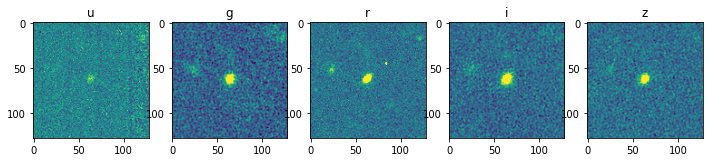

In [8]:
channels = ["u", "g", "r", "i", "z"]
fig, axes = plt.subplots(1,5, figsize=(12,8))
for i in range(5):
    norm = ImageNormalize(plot_cutouts[:,:,i], interval=ZScaleInterval())
    axes[i].imshow(plot_cutouts[:,:,i], norm=norm)
    axes[i].set_title(channels[i])

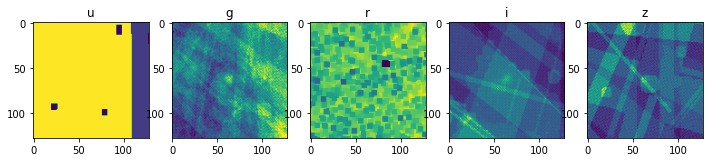

In [9]:
channels = ["u", "g", "r", "i", "z"]
fig, axes = plt.subplots(1,5, figsize=(12,8))
for i in range(5):
    norm = ImageNormalize(plot_weights[:,:,i], interval=ZScaleInterval())
    axes[i].imshow(plot_weights[:,:,i], norm=norm)
    axes[i].set_title(channels[i])

In [12]:
plot_cutouts[:,:,1].shape

(128, 128)

# Get tile ids

In [14]:
tile_list = open(image_dir + "tiles.list", "r")
#for tile in tile_list.readlines():
    #print(tile[:-1])
tile_list.close()

In [15]:
# Only use tiles with all five channels
tile_list = open(image_dir + "tiles.list", "r")
tile_ids = []

for tile in tile_list:
    tile = tile[:-1] # Remove new line character
    channels = tile.split(" ")
    if len(channels) == 5: # Order is u,g,r,i,z
        tile_ids.append(channels[0][5:12]) # XXX.XXX id
tile_list.close()

In [15]:
import csv 
np.savetxt(cutout_dir + 'tiles_5channel_41tiles.csv', tile_ids, delimiter =" ",  fmt ='% s') 

In [16]:
print(len(tile_ids))
print(tile_ids[1])

41
181.271


In [17]:
len(hf.get(tile_ids[1]))

2

In [16]:
n_cutouts = 0
for i in range(5):
    print(i)
    n_cutouts += len(hf.get(tile_ids[i] + "/IMAGES"))
print(n_cutouts)


0
1


KeyboardInterrupt: 

In [ ]:
#n_cutouts for 10 tiles =131721
#n_cutouts for 5 tiles = 57399

In [17]:
n_valid = len(hf.get(tile_ids[12] + "/IMAGES"))

In [ ]:
print('There are ' + str(n_cutouts) + ' training examples')
print('There are ' + str(n_valid) + ' validation examples')

# Prepare Training

In [18]:
# tiles for val and training
train_indices = range(5)
val_indices = [12]

In [19]:
BATCH_SIZE = 256 #128
CUTOUT_SIZE = 128
N_EPOCHS = 8 #12
weights_cfis = np.zeros((BATCH_SIZE, CUTOUT_SIZE, CUTOUT_SIZE, 2))
weights_ps1 = np.zeros((BATCH_SIZE, CUTOUT_SIZE, CUTOUT_SIZE, 3))
weights_all = np.zeros((BATCH_SIZE, CUTOUT_SIZE, CUTOUT_SIZE, 5))

In [20]:
%autoreload
test_index = 13
#sources_test_cfis = get_test_cutouts(test_index, 50, cutout_size, "cfis")
#sources_test_ps1 = get_test_cutouts(test_index, 50, cutout_size, "ps1")
(sources_test_all, weights_test_all) = get_test_cutouts(test_index, 50, bands = "all")
sources_test_all.shape

(50, 128, 128, 5)

# 1. Autoencoder with pooling layers

### Training

In [49]:
from create_models import create_autoencoder1

In [52]:
%autoreload
autoencoder1 = create_autoencoder1((CUTOUT_SIZE, CUTOUT_SIZE, 5))
#opt = keras.optimizers.Adam(learning_rate=0.005)
autoencoder1.compile(optimizer="adam", loss=tf.keras.losses.MeanSquaredError())

In [53]:
autoencoder1.summary()

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 128, 128, 5)]     0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 128, 128, 16)      736       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 64, 64, 16)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 64, 64, 32)        4640      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)              

In [54]:
%autoreload
(autoencoder1, history1) = train_autoencoder(autoencoder1, train_indices, val_indices, n_epochs = N_EPOCHS,batch_size=BATCH_SIZE)

Epoch 1/8
 17/224 [=>............................] - ETA: 5:15 - loss: 4.0774

KeyboardInterrupt: 

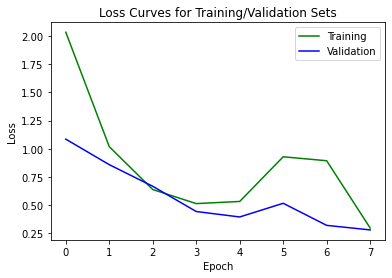

In [47]:
plot_loss_curves(history1.history, 'trial_1_with_5_tiles')

### Testing

In [53]:
#decode new images
decoded_imgs1 = autoencoder1.predict(sources_test_all)

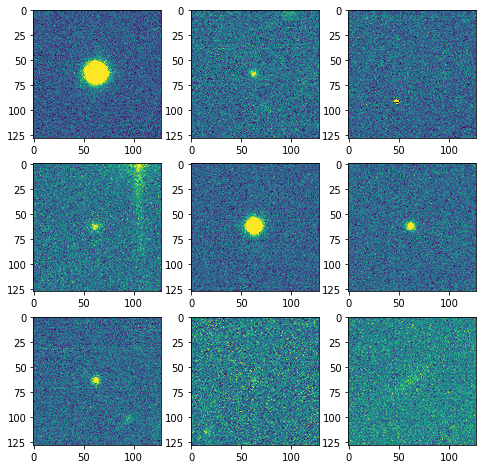

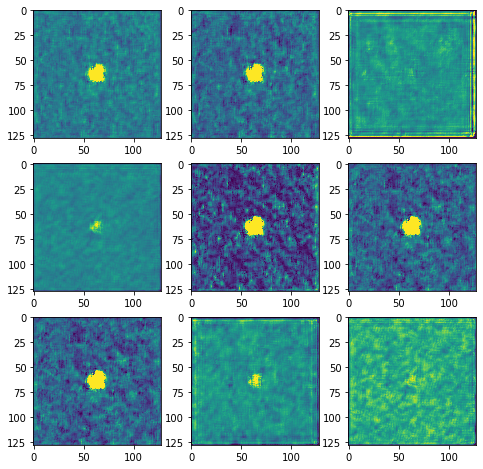

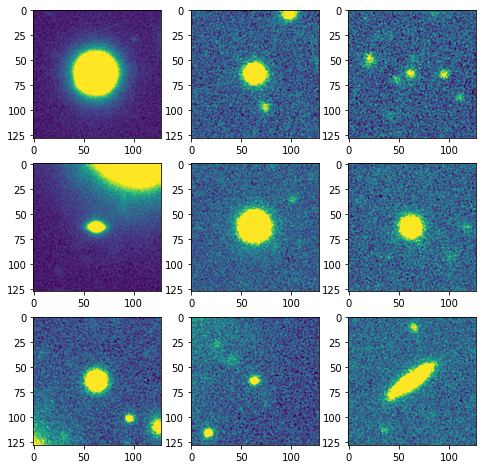

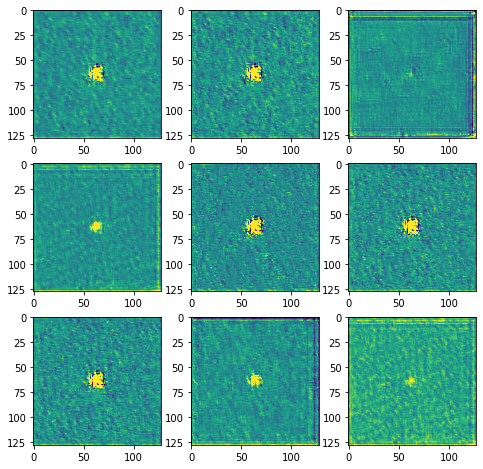

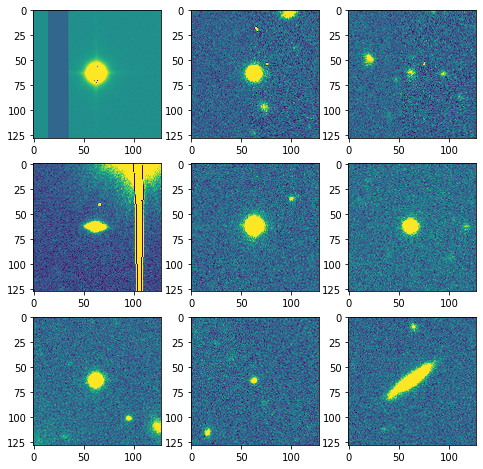

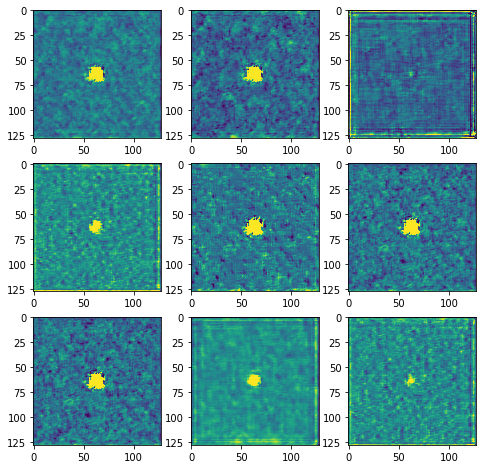

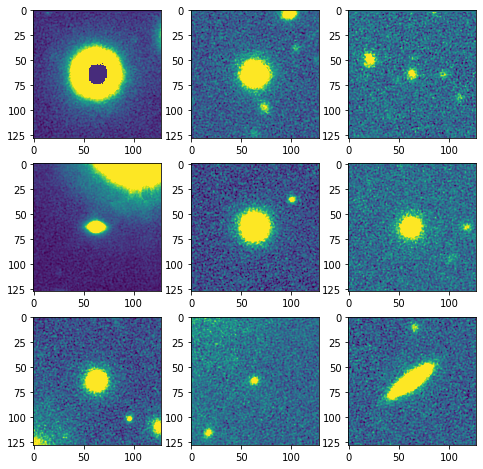

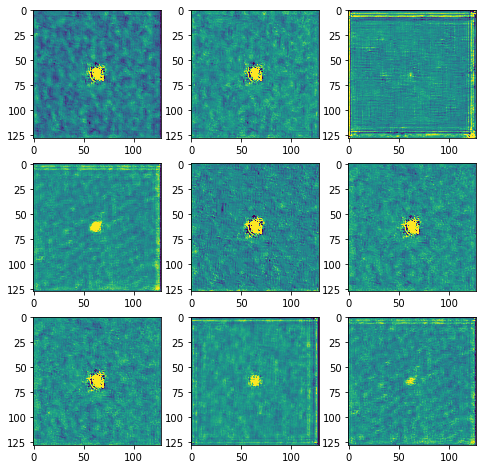

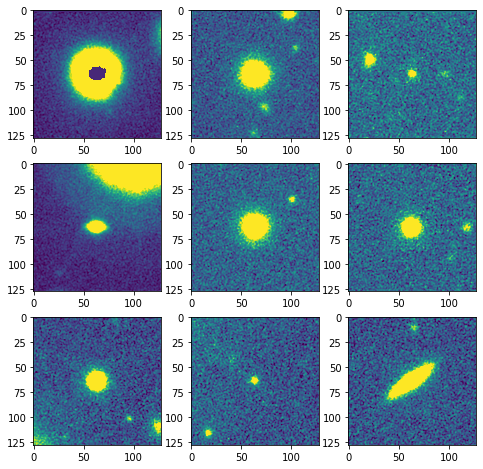

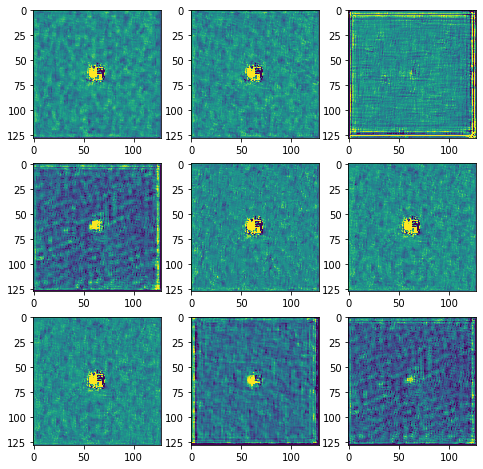

In [73]:
#plot original and predictions on test set
for i in range(5):
    plot_images(sources_test_all, i)
    plt.savefig('../Plots/trial1_5tiles_original1'+str(i))
    plot_images(decoded_imgs1,i)
    plt.savefig('../Plots/trial1_5tiles_encoded1'+str(i))

# 2. Fully convolutional autoencoder

In [32]:
#if previously trained
autoencoder_all = keras.models.load_model("../Models/autoencoder_64p")#custom_objects={'custom_loss_all': custom_loss_all})
hist_csv_file = '../Histories/history_64p.csv'

## ($i$) Trained on all filters

In [30]:
autoencoder_all = create_autoencoder2((CUTOUT_SIZE, CUTOUT_SIZE, 5))
autoencoder_all.compile(optimizer='adam', loss='mean_squared_error')

In [30]:
autoencoder_all.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 5) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 16) 736         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 128, 128, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 32) 4640        batch_normalization[0][0]        
_______________________________________________________________________________________

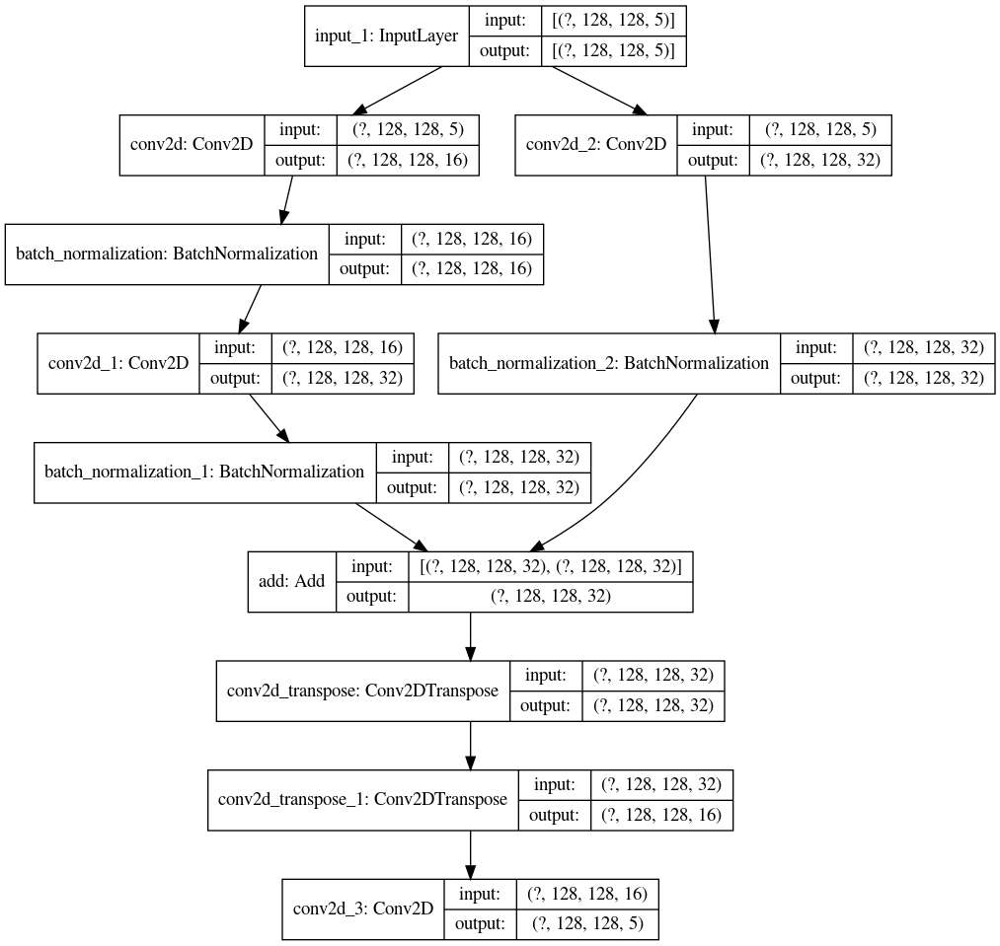

In [31]:
keras.utils.plot_model(autoencoder_all, to_file='../Models/autoencoder_64p_plot.png', show_shapes=True, show_layer_names=True)

In [32]:
(autoencoder_all, history_all) = train_autoencoder(autoencoder_all, train_indices, val_indices, N_EPOCHS,
                                                   BATCH_SIZE, CUTOUT_SIZE)
autoencoder_all.save("../Models/autoencoder_64p")
hist_df = pd.DataFrame(history_all.history) 

hist_csv_file = '../Histories/history_64p.csv'
with open(hist_csv_file, mode='a') as f:
    hist_df.to_csv(f)

Epoch 1/8
112/112 [==============================] - 2167s 19s/step - loss: 1.9884 - val_loss: 0.5717
Epoch 2/8
112/112 [==============================] - 612s 5s/step - loss: 1.0735 - val_loss: 0.2470
Epoch 3/8
112/112 [==============================] - 699s 6s/step - loss: 0.6397 - val_loss: 0.1864
Epoch 4/8
112/112 [==============================] - 587s 5s/step - loss: 0.4322 - val_loss: 0.1462
Epoch 5/8
112/112 [==============================] - 592s 5s/step - loss: 0.3638 - val_loss: 0.1222
Epoch 6/8
112/112 [==============================] - 584s 5s/step - loss: 0.2949 - val_loss: 0.1001
Epoch 7/8
112/112 [==============================] - 626s 6s/step - loss: 0.2432 - val_loss: 0.0968
Epoch 8/8
112/112 [==============================] - 576s 5s/step - loss: 0.2468 - val_loss: 0.1019
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as

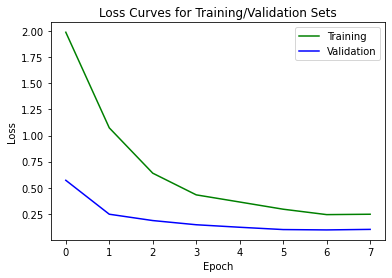

In [25]:
%autoreload
history_all = pd.read_csv(hist_csv_file)
plot_loss_curves(history_all, figname="trial1_a2_FiveTrainingTiles64p_copy.png")

### Testing autoencoder2

In [33]:
decoded_imgs_all = autoencoder_all.predict(sources_test_all)
residuals_all = sources_test_all - decoded_imgs_all

UnknownError:  Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[node functional_1/conv2d/Relu (defined at <ipython-input-33-a732171ff8c9>:1) ]] [Op:__inference_predict_function_7546]

Function call stack:
predict_function


In [ ]:
bands=["CFIS u", "PS1 g", "CFIS r", "PS1 i", "PS1 z"]

In [92]:
tile_ids[test_index]

'185.270'

In [67]:
imgs_all = np.zeros((3, *sources_test_all.shape))
imgs_all[0] = sources_test_all
imgs_all[1] = decoded_imgs_all
imgs_all[2] = residuals_all
imgs_all.shape

(3, 50, 128, 128, 5)

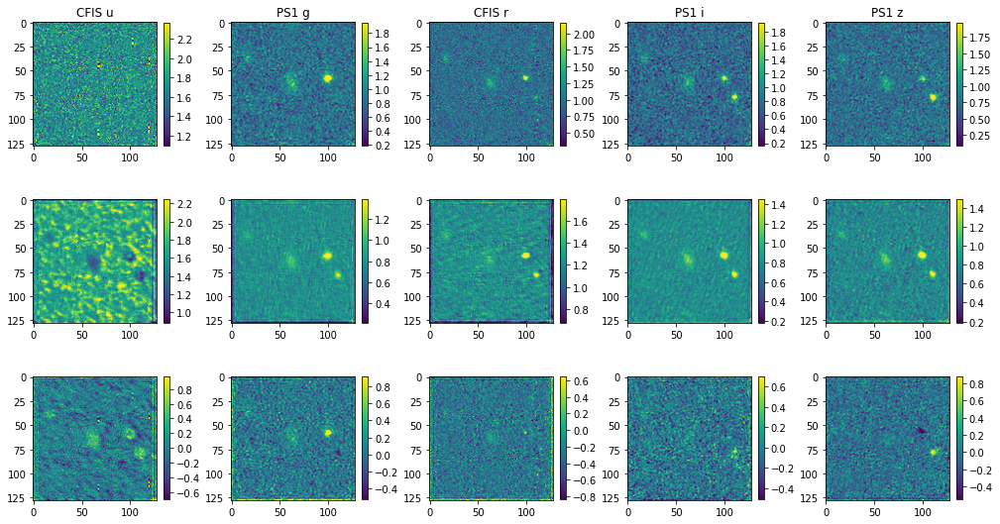

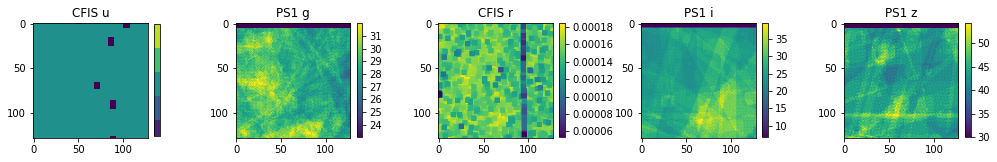

In [103]:
%autoreload

plot_1_cutout(imgs_all, weights_test_all, "Cutouts 185.270 c12 64p colorbar.png", bands=bands, start=15)

#### Plotting all (50) test images, reconstructions and residuals

In [117]:
from functions import *

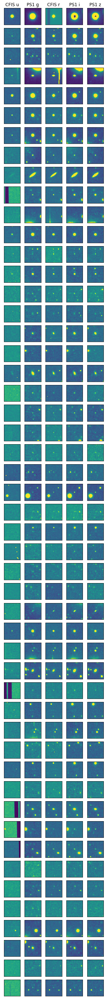

In [107]:
%autoreload
plot_mosaic(sources_test_all, 'sources_images_all')

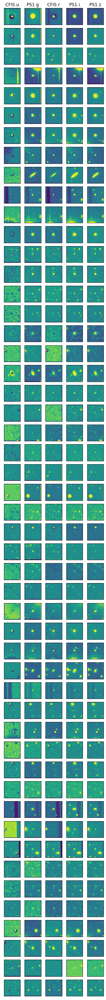

In [79]:
plot_mosaic(decoded_imgs_all, 'decoded_images_all')

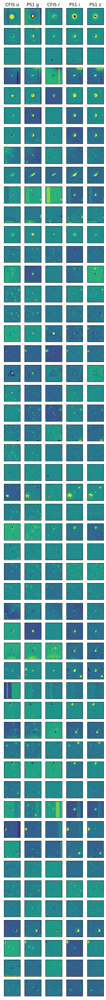

In [80]:
plot_mosaic(residuals_all, 'residuals_all')

In [115]:
%autoreload
min_max_pixels(sources_test_all, bands=bands, start=5)

CFIS u
Min pixel value: 0.0
Max pixel value: 3.139971971511841

PS1 g
Min pixel value: 0.0
Max pixel value: 13.585445404052734

CFIS r
Min pixel value: 0.0
Max pixel value: 77.27584075927734

PS1 i
Min pixel value: 0.0
Max pixel value: 21.349979400634766

PS1 z
Min pixel value: 0.0
Max pixel value: 22.422582626342773



In [116]:
min_max_pixels(decoded_imgs_all, bands=bands, start=5)

CFIS u
Min pixel value: -0.97918856
Max pixel value: 13.0163355

PS1 g
Min pixel value: -0.050566792
Max pixel value: 17.61034

CFIS r
Min pixel value: -0.010038987
Max pixel value: 72.09573

PS1 i
Min pixel value: 0.056745127
Max pixel value: 19.909546

PS1 z
Min pixel value: 0.018426433
Max pixel value: 24.050175



In [84]:
min_max_pixels(residuals_all, bands=bands, start=5)

CFIS u
Min pixel value: -10.362400531768799
Max pixel value: 2.63502836227417

PS1 g
Min pixel value: -5.219818115234375
Max pixel value: 5.6150803565979

CFIS r
Min pixel value: -3.761496067047119
Max pixel value: 7.481996536254883

PS1 i
Min pixel value: -2.187427520751953
Max pixel value: 5.139809608459473

PS1 z
Min pixel value: -3.1425037384033203
Max pixel value: 5.022590637207031



In [22]:
plot_hist(imgs_all, weights_test_all, "Cutouts 185.270 c46 64p weight_res.png", bands=bands, start=46)

NameError: name 'imgs_all' is not defined

## ($ii$) Train on CFIS filters (u,r)


In [21]:
# tiles for val and training
train_indices = range(4)
val_indices = [12]
BATCH_SIZE= 128

In [24]:
autoencoder_cfis = create_autoencoder2((CUTOUT_SIZE, CUTOUT_SIZE, 2))
autoencoder_cfis.compile(optimizer="adam", loss=custom_loss_cfis)

In [20]:
autoencoder_cfis.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 2) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 16) 304         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 128, 128, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 32) 4640        batch_normalization[0][0]        
_______________________________________________________________________________________

In [27]:
weights_cfis[1].shape

(128, 128, 2)

In [21]:
def custom_loss_cfis(y_true, y_pred):
    return keras.losses.MSE(y_true*np.sqrt(weights_cfis), y_pred*np.sqrt(weights_cfis))

In [27]:
(autoencoder_cfis, history_cfis) = train_autoencoder(autoencoder_cfis, train_indices, 
                                                     val_indices, batch_size=BATCH_SIZE, cutout_size=CUTOUT_SIZE, n_epochs= N_EPOCHS, bands="cfis")

Epoch 1/8
276/276 [==============================] - 865s 3s/step - loss: 0.0094 - val_loss: 0.0073
Epoch 2/8
276/276 [==============================] - 287s 1s/step - loss: 0.0099 - val_loss: 0.0117
Epoch 3/8
276/276 [==============================] - 263s 951ms/step - loss: 0.0078 - val_loss: 0.0060
Epoch 4/8
276/276 [==============================] - 291s 1s/step - loss: 0.0072 - val_loss: 0.0065
Epoch 5/8
276/276 [==============================] - 268s 972ms/step - loss: 0.0066 - val_loss: 0.0063
Epoch 6/8
276/276 [==============================] - 277s 1s/step - loss: 0.0068 - val_loss: 0.0090
Epoch 7/8
276/276 [==============================] - 269s 975ms/step - loss: 0.0068 - val_loss: 0.0059
Epoch 8/8
276/276 [==============================] - 301s 1s/step - loss: 0.0059 - val_loss: 0.0053


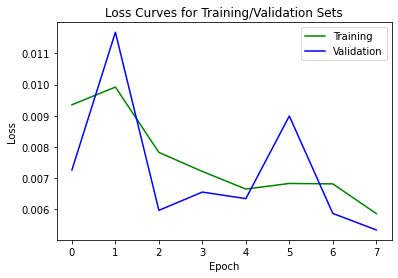

In [29]:
plot_loss_curves(history_cfis, figname="TenTrainingTilesCFIS.png")

In [30]:
test_index = 13
sources_test_cfis, weights_test_cfis = get_test_cutouts(test_index, 50, CUTOUT_SIZE, "cfis")
sources_test_ps1,  weights_test_ps1  = get_test_cutouts(test_index, 50, CUTOUT_SIZE, "ps1")

In [31]:
decoded_imgs_cfis = autoencoder_cfis.predict(sources_test_cfis)
residuals_cfis = sources_test_cfis - decoded_imgs_cfis

In [32]:
sources_test_cfis.shape

(50, 128, 128, 2)

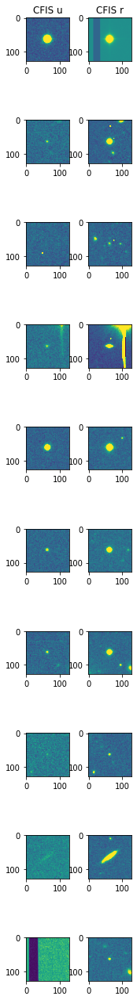

In [34]:
plot_images(sources_test_cfis[:10,:,:,:], "Test Cutouts 185.270 CFIS.png", bands=["CFIS u", "CFIS r"], start=2)

/home/anahoban/lensing/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:164: RuntimeWarning: invalid value encountered in true_divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


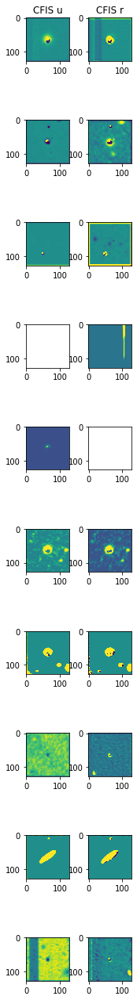

In [35]:
plot_images(decoded_imgs_cfis[:10,:,:,:], "Reconstructed Cutouts 185.270 CFIS.png", bands=["CFIS u", "CFIS r"], start=2)

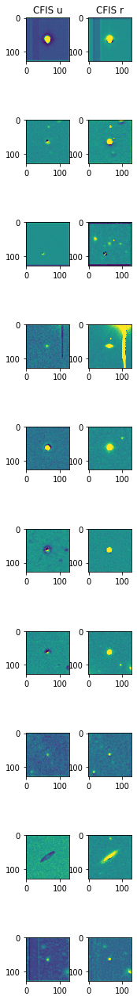

In [36]:
plot_images(residuals_cfis[:10,:,:,:], "Residual Cutouts 185.270 CFIS.png", bands=["CFIS u", "CFIS r"], start=2)

In [39]:
min_max_pixels(sources_test_cfis[:10,:,:,:], bands=["CFIS u", "CFIS r"], start=2)

CFIS u
Min pixel value: 0.0
Max pixel value: 371.0359191894531

CFIS r
Min pixel value: 0.0
Max pixel value: 11.138917922973633



In [40]:
min_max_pixels(decoded_imgs_cfis[:10,:,:,:], bands=["CFIS u", "CFIS r"], start=2)

CFIS u
Min pixel value: -28.002323
Max pixel value: 217.66777

CFIS r
Min pixel value: -22.851807
Max pixel value: 32.943737



In [41]:
min_max_pixels(residuals_cfis[:10,:,:,:], bands=["CFIS u", "CFIS r"], start=2)

CFIS u
Min pixel value: -99.71379852294922
Max pixel value: 153.36814880371094

CFIS r
Min pixel value: -32.50224646925926
Max pixel value: 23.55015105009079



In [42]:
 weights_test_cfis.shape

(50, 128, 128, 2)

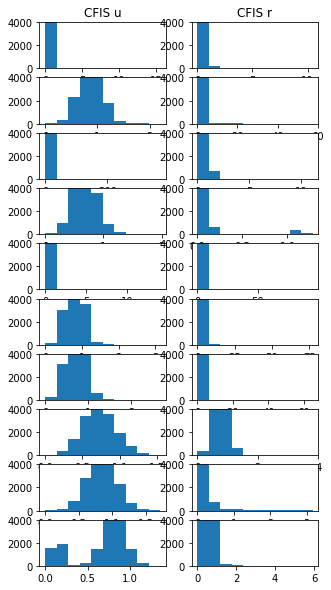

In [44]:
plot_hist(sources_test_cfis[:10,:,:,:], weights_test_cfis[:10,:,:,:],
          figname ="Test Cutouts 185.270 CFIS.png", bands=["CFIS u", "CFIS r"])

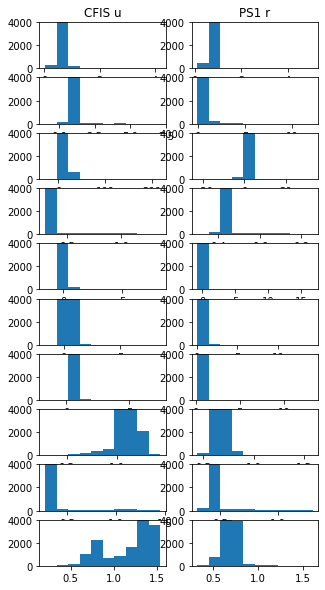

In [45]:
plot_hist(decoded_imgs_cfis[:10,:,:,:], weights_test_cfis[:10,:,:,:], figname= "Reconstructed Cutouts 185.270 CFIS.png",
          bands=["CFIS u", "PS1 r"])

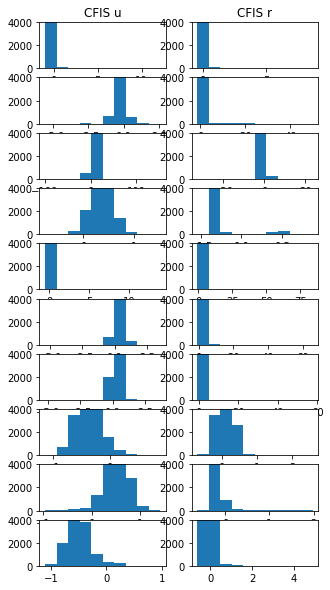

In [46]:
plot_hist(residuals_cfis[:10,:,:,:], weights_test_cfis[:10,:,:,:],
          figname = "Residual Cutouts 185.270 CFIS.png", bands=["CFIS u", "CFIS r"])

## ($iii$) Train on PS1 filters (i,g,z)

In [32]:
#if previously trained
autoencoder_ps1 = keras.models.load_model("../Models/autoencoder_ps1_128p")#custom_objects={'custom_loss_all': custom_loss_all})
hist_ps1_csv = '../Histories/history_ps1_128p.csv'
history_ps1 = pd.read_csv(hist_ps1_csv)

In [30]:
autoencoder_ps1 = create_autoencoder2((CUTOUT_SIZE, CUTOUT_SIZE, 3))
autoencoder_ps1.compile(optimizer="adam", loss='mean_squared_error')

In [104]:
autoencoder_ps1.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 128, 128, 16) 448         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_3 (BatchNor (None, 128, 128, 16) 64          conv2d_4[0][0]                   
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 128, 128, 32) 4640        batch_normalization_3[0][0]      
_______________________________________________________________________________________

In [31]:
(autoencoder_ps1, history_ps1) = train_autoencoder(autoencoder_ps1, train_indices, 
                                                     val_indices, n_epochs= N_EPOCHS, batch_size = BATCH_SIZE, 
                                                     cutout_size = CUTOUT_SIZE, bands="ps1")

Epoch 1/8
112/112 [==============================] - 1436s 13s/step - loss: 0.0599 - val_loss: 0.0825
Epoch 2/8
112/112 [==============================] - 428s 4s/step - loss: 0.0179 - val_loss: 0.0276
Epoch 3/8
112/112 [==============================] - 479s 4s/step - loss: 0.0134 - val_loss: 0.0139
Epoch 4/8
112/112 [==============================] - 465s 4s/step - loss: 0.0107 - val_loss: 0.0096
Epoch 5/8
112/112 [==============================] - 486s 4s/step - loss: 0.0092 - val_loss: 0.0084
Epoch 6/8
112/112 [==============================] - 426s 4s/step - loss: 0.0080 - val_loss: 0.0070
Epoch 7/8
112/112 [==============================] - 443s 4s/step - loss: 0.0069 - val_loss: 0.0061
Epoch 8/8
112/112 [==============================] - 454s 4s/step - loss: 0.0062 - val_loss: 0.0047


In [32]:
autoencoder_ps1.save("../Models/autoencoder_ps1_128p")
hist_df = pd.DataFrame(history_ps1.history) 

hist_csv_file = '../Histories/history_ps1_128p.csv'
with open(hist_csv_file, mode='a') as f:
    hist_df.to_csv(f)

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: ../Models/autoencoder_ps1_128p/assets


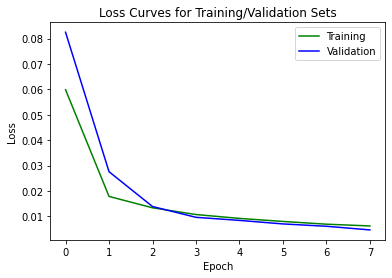

In [69]:
plot_loss_curves(history_ps1, figname="TenTrainingTilesPS1.png")

In [38]:
decoded_imgs_ps1 = autoencoder_ps1.predict(sources_test_ps1)
residuals_ps1 = sources_test_ps1 - decoded_imgs_ps1

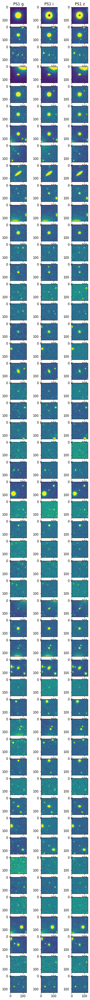

In [47]:
plot_images(sources_test_ps1, "Test Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

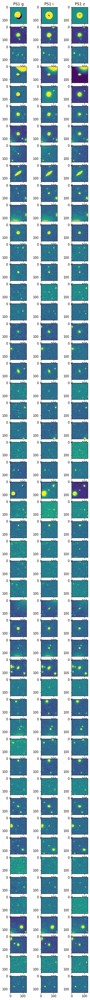

In [48]:
plot_images(decoded_imgs_ps1, "Reconstructed Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

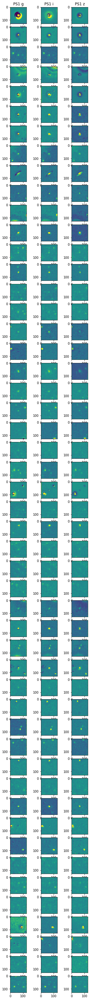

In [49]:
plot_images(residuals_ps1, "Residual Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

In [50]:
min_max_pixels(sources_test_ps1, bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

PS1 g
Min pixel value: 0.0
Max pixel value: 13.585445404052734

PS1 i
Min pixel value: 0.0
Max pixel value: 21.349979400634766

PS1 z
Min pixel value: 0.0
Max pixel value: 22.422582626342773



In [51]:
min_max_pixels(decoded_imgs_ps1, bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

PS1 g
Min pixel value: -0.017195463
Max pixel value: 12.378188

PS1 i
Min pixel value: -0.0026976168
Max pixel value: 19.830736

PS1 z
Min pixel value: 0.057978816
Max pixel value: 21.700657



In [52]:
min_max_pixels(residuals_ps1, bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

PS1 g
Min pixel value: -0.4988560676574707
Max pixel value: 2.066847801208496

PS1 i
Min pixel value: -0.34091901779174805
Max pixel value: 1.9006462097167969

PS1 z
Min pixel value: -0.3474876880645752
Max pixel value: 1.2243499755859375



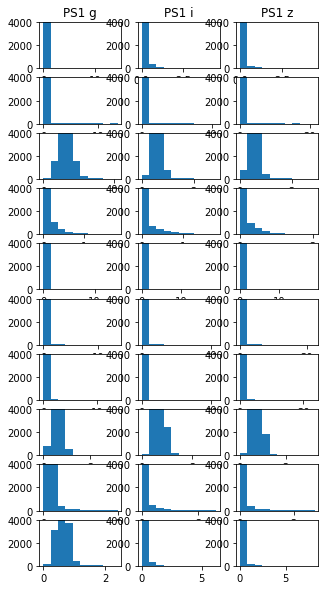

In [61]:
plot_hist(sources_test_ps1[:10], weights_test_ps1[:10],"Test Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"])#, start=5)

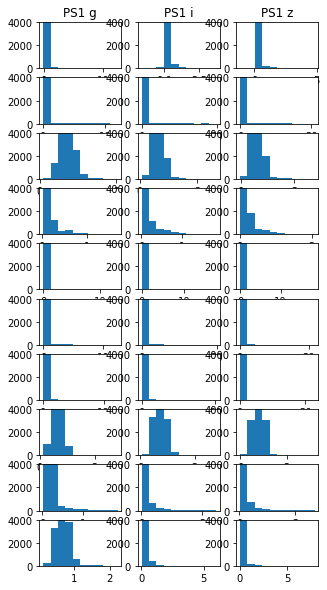

In [64]:
plot_hist(decoded_imgs_ps1[:10], weights_test_ps1[:10], "Reconstructed Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"])#, start=5)

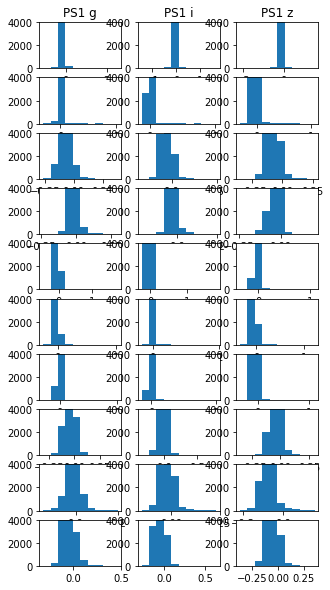

In [63]:
plot_hist(residuals_ps1[:10], weights_test_ps1[:10], "Residual Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"])#, start=5)

In [34]:
hf.close()